#IMPORTING NECESSARY LIBRARIES


In [ ]:
import pandas as pd
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
import xgboost
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc, RocCurveDisplay
from sklearn.model_selection import GridSearchCV
import pickle
from imblearn.over_sampling import SMOTE

#Importing the Dataset

In [ ]:
df=pd.read_csv('/content/Weather.csv - Dataset.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Delhi,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Delhi,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Delhi,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Delhi,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Delhi,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


#Analysing the data

In [ ]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Delhi,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Delhi,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Delhi,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Delhi,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Delhi,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [ ]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

#Handling Missing Values

In [ ]:
df.isnull().sum()

,0
Date,0
Location,0
MinTemp,1485
MaxTemp,1261
Rainfall,3261
Evaporation,62790
Sunshine,69835
WindGustDir,10326
WindGustSpeed,10263
WindDir9am,10566


In [ ]:
df['MinTemp'].fillna(df['MinTemp'].median(), inplace = True)
df['MaxTemp'].fillna(df['MaxTemp'].median(), inplace = True)
df['Rainfall'].fillna(df['Rainfall'].median(), inplace = True)
df['Evaporation'].fillna(df['Evaporation'].median(), inplace = True)
df['Sunshine'].fillna(df['Sunshine'].median(), inplace = True)
df['WindGustSpeed'].fillna(df['WindGustSpeed'].median(), inplace = True)
df['WindSpeed9am'].fillna(df['WindSpeed9am'].median(), inplace = True)
df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].median(), inplace = True)
df['Humidity9am'].fillna(df['Humidity9am'].median(), inplace = True)
df['Humidity3pm'].fillna(df['Humidity3pm'].median(), inplace = True)
df['Pressure9am'].fillna(df['Pressure9am'].median(), inplace = True)
df['Pressure3pm'].fillna(df['Pressure3pm'].median(), inplace = True)
df['Cloud9am'].fillna(df['Cloud9am'].median(), inplace = True)
df['Cloud3pm'].fillna(df['Cloud3pm'].median(), inplace = True)
df['Temp9am'].fillna(df['Temp9am'].median(), inplace = True)
df['Temp3pm'].fillna(df['Temp3pm'].median(), inplace = True)

<ipython-input-3-ca8badcad957>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['MinTemp'].fillna(df['MinTemp'].median(), inplace = True)
<ipython-input-3-ca8badcad957>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)'

In [ ]:
df['WindDir9am'].fillna(df['WindDir9am'].mode()[0], inplace=True)
df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0], inplace=True)
df['RainToday'].fillna(df['RainToday'].mode()[0], inplace=True)
df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0], inplace=True)
df['WindGustDir'].fillna(df['WindGustDir'].mode()[0], inplace=True)

<ipython-input-4-f7dce2da9208>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['WindDir9am'].fillna(df['WindDir9am'].mode()[0], inplace=True)
<ipython-input-4-f7dce2da9208>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=T

In [ ]:
df.isnull().sum()

,0
Date,0
Location,0
MinTemp,0
MaxTemp,0
Rainfall,0
Evaporation,0
Sunshine,0
WindGustDir,0
WindGustSpeed,0
WindDir9am,0


In [ ]:
df


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Delhi,13.4,22.9,0.6,4.8,8.4,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No
1,2008-12-02,Delhi,7.4,25.1,0.0,4.8,8.4,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No
2,2008-12-03,Delhi,12.9,25.7,0.0,4.8,8.4,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No
3,2008-12-04,Delhi,9.2,28.0,0.0,4.8,8.4,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No
4,2008-12-05,Delhi,17.5,32.3,1.0,4.8,8.4,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,4.8,8.4,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,5.0,5.0,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,4.8,8.4,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,5.0,5.0,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,4.8,8.4,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,4.8,8.4,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


#Handling Outliers

In [ ]:
def plot_box_plots(df, columns):
    plt.figure(figsize=(25, 20))
    for i, column in enumerate(columns, 1):
        plt.subplot(len(columns) // 3 + 1, 3, i)
        sns.boxplot(y=df[column])
        plt.title(f'Box plot of {column}')
    plt.tight_layout()
    plt.show()

In [ ]:
numerical_columns = ['MinTemp','WindGustSpeed', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

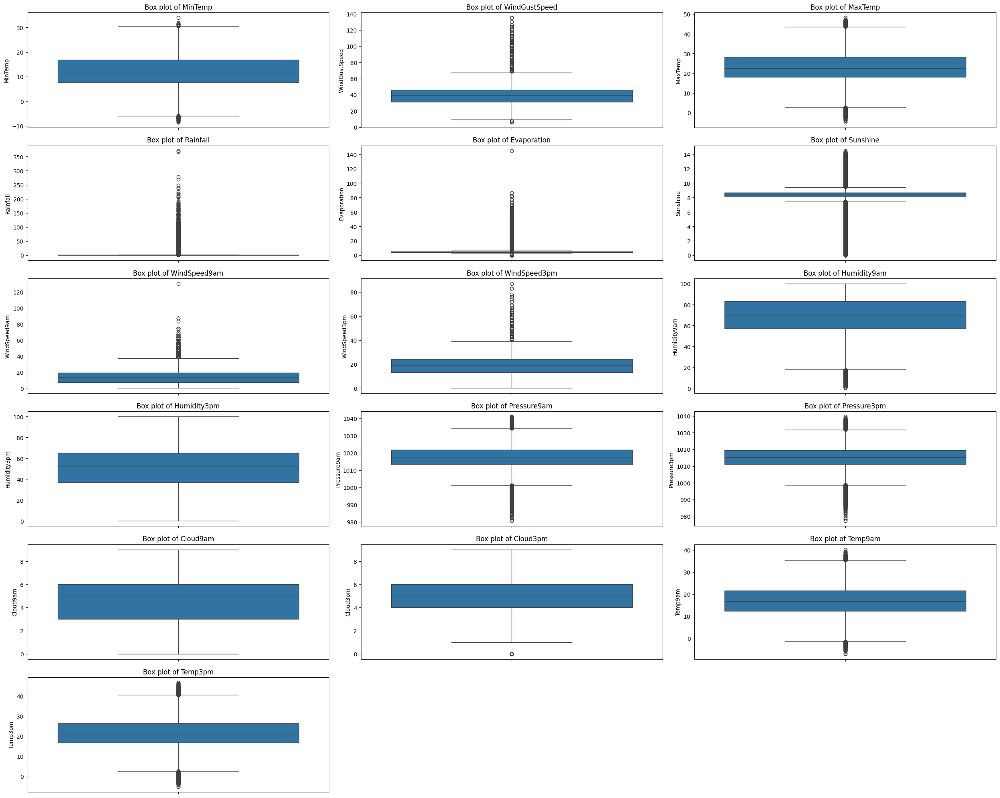

In [ ]:
plot_box_plots(df, numerical_columns)

In [ ]:
def handle_outliers_iqr(column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Replace outliers with the nearest non-outlier values
    df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
    df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])

In [ ]:
for column in numerical_columns:
    handle_outliers_iqr(column)


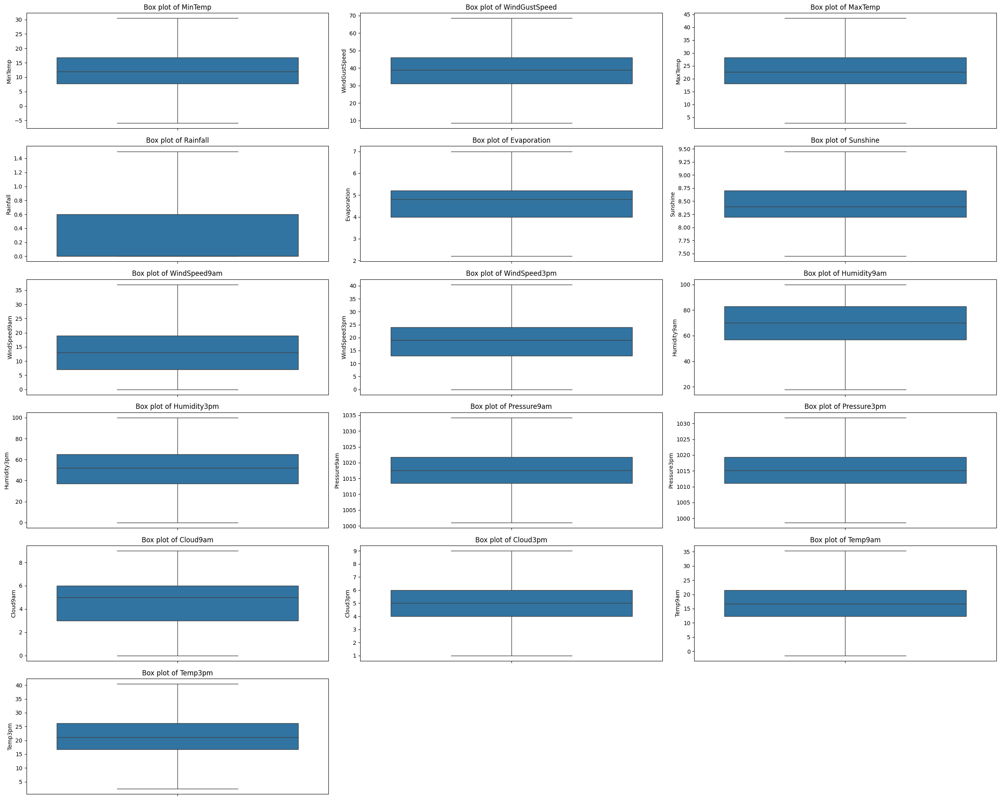

In [ ]:
plot_box_plots(df, numerical_columns)

#Encoding the categorical columns

In [ ]:
le = LabelEncoder()

In [ ]:

df['WindDir9am'] = le.fit_transform(df['WindDir9am'])
df['WindDir3pm'] = le.fit_transform(df['WindDir3pm'])
df['RainToday'] = le.fit_transform(df['RainToday'])
df['RainTomorrow'] = le.fit_transform(df['RainTomorrow'])
df['Location'] = le.fit_transform(df['Location'])
df['WindGustDir'] = le.fit_transform(df['WindGustDir'])

In [ ]:
wind_gust_dir_mapping = dict(zip(le.classes_, le.transform(le.classes_)))

In [ ]:
print(wind_gust_dir_mapping)

{'E': 0, 'ENE': 1, 'ESE': 2, 'N': 3, 'NE': 4, 'NNE': 5, 'NNW': 6, 'NW': 7, 'S': 8, 'SE': 9, 'SSE': 10, 'SSW': 11, 'SW': 12, 'W': 13, 'WNW': 14, 'WSW': 15}


In [ ]:
# Convert the 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Extract year, month, and day into new columns
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

# Drop the original 'Date' column
df = df.drop(columns=['Date'])

In [ ]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,14,13.4,22.9,0.6,4.8,8.4,13,44.0,13,14,...,1007.1,8.0,5.0,16.9,21.8,0,0,2008,12,1
1,14,7.4,25.1,0.0,4.8,8.4,14,44.0,6,15,...,1007.8,5.0,5.0,17.2,24.3,0,0,2008,12,2
2,14,12.9,25.7,0.0,4.8,8.4,15,46.0,13,15,...,1008.7,5.0,2.0,21.0,23.2,0,0,2008,12,3
3,14,9.2,28.0,0.0,4.8,8.4,4,24.0,9,0,...,1012.8,5.0,5.0,18.1,26.5,0,0,2008,12,4
4,14,17.5,32.3,1.0,4.8,8.4,13,41.0,1,7,...,1006.0,7.0,8.0,17.8,29.7,0,0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,42,2.8,23.4,0.0,4.8,8.4,0,31.0,9,1,...,1020.3,5.0,5.0,10.1,22.4,0,0,2017,6,21
145456,42,3.6,25.3,0.0,4.8,8.4,6,22.0,9,3,...,1019.1,5.0,5.0,10.9,24.5,0,0,2017,6,22
145457,42,5.4,26.9,0.0,4.8,8.4,3,37.0,9,14,...,1016.8,5.0,5.0,12.5,26.1,0,0,2017,6,23
145458,42,7.8,27.0,0.0,4.8,8.4,9,28.0,10,3,...,1016.5,3.0,2.0,15.1,26.0,0,0,2017,6,24


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  int64  
 1   MinTemp        145460 non-null  float64
 2   MaxTemp        145460 non-null  float64
 3   Rainfall       145460 non-null  float64
 4   Evaporation    145460 non-null  float64
 5   Sunshine       145460 non-null  float64
 6   WindGustDir    145460 non-null  int64  
 7   WindGustSpeed  145460 non-null  float64
 8   WindDir9am     145460 non-null  int64  
 9   WindDir3pm     145460 non-null  int64  
 10  WindSpeed9am   145460 non-null  float64
 11  WindSpeed3pm   145460 non-null  float64
 12  Humidity9am    145460 non-null  float64
 13  Humidity3pm    145460 non-null  float64
 14  Pressure9am    145460 non-null  float64
 15  Pressure3pm    145460 non-null  float64
 16  Cloud9am       145460 non-null  float64
 17  Cloud3pm       145460 non-nul

#Data Visualization

<Axes: >

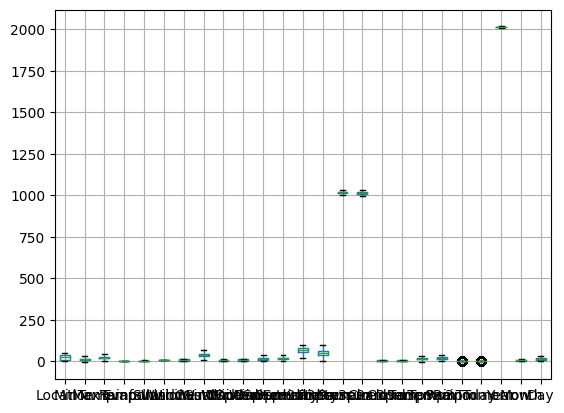

In [ ]:
df.boxplot()

In [ ]:
def plot_dist_plots(df, columns):
    num_columns = len(columns)
    rows = (num_columns // 2) + (num_columns % 2)  # Adjust the number of rows
    plt.figure(figsize=(15, rows * 5))  # Increase the height of the figure
    for i, column in enumerate(columns, 1):
        plt.subplot(rows, 2, i)  # Use 2 columns for subplots
        sns.histplot(df[column], kde=True)  # Use histplot with KDE
        plt.title(f'Distribution plot of {column}')
    plt.tight_layout()
    plt.show()

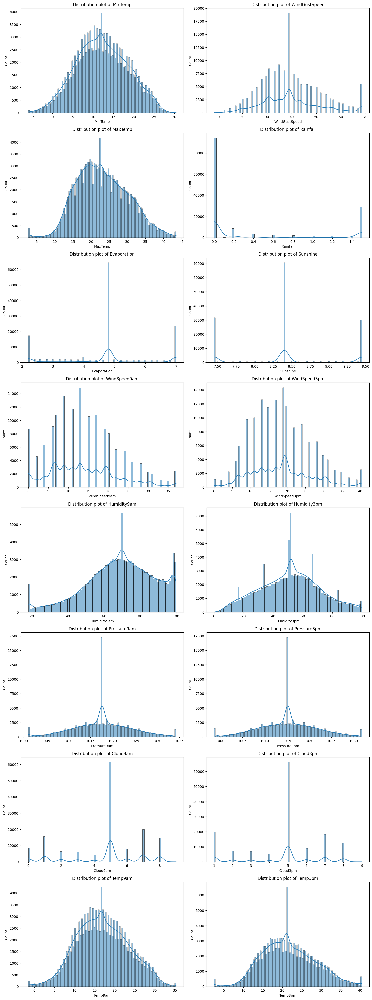

In [ ]:
plot_dist_plots(df, numerical_columns)

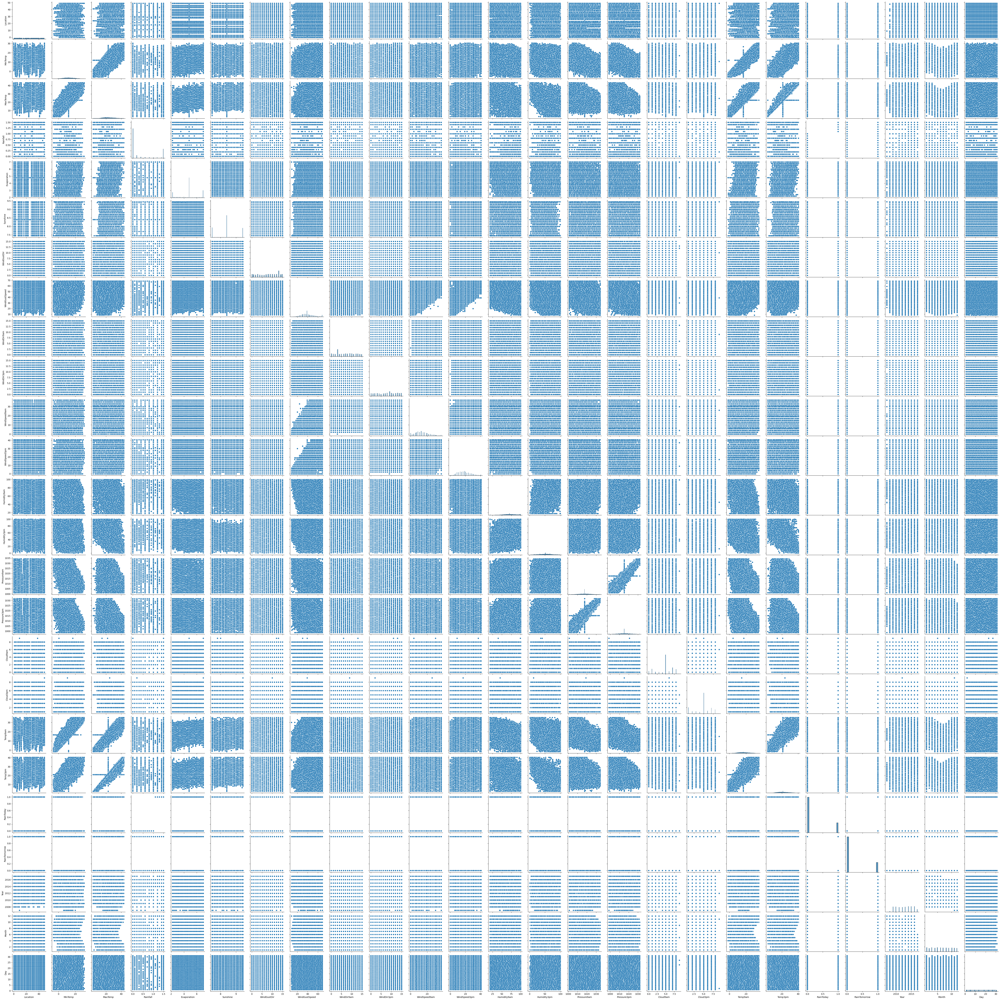

In [ ]:
sns.pairplot(df)

In [ ]:
df.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Location,1.000000,-0.008495,-0.022874,-0.005460,0.009584,0.001197,-0.003074,0.073702,-0.002808,0.009451,...,0.045870,-0.005210,-0.012260,-0.018131,-0.025042,-0.005573,0.001176,0.020809,-0.006821,-0.000350
MinTemp,-0.008495,1.000000,0.733335,0.045802,0.420752,0.067586,-0.136605,0.184574,-0.031203,-0.159838,...,-0.440256,0.043063,-0.002342,0.897917,0.698505,0.054701,0.083237,0.042951,-0.202698,0.002355
MaxTemp,-0.022874,0.733335,1.000000,-0.262982,0.502055,0.312052,-0.212363,0.078237,-0.212816,-0.182048,...,-0.405978,-0.232739,-0.217400,0.879546,0.968508,-0.225023,-0.154837,0.061500,-0.163080,0.000697
Rainfall,-0.005460,0.045802,-0.262982,1.000000,-0.204075,-0.256953,0.138781,0.143865,0.183530,0.131961,...,-0.086562,0.263909,0.226625,-0.120977,-0.267579,0.956998,0.321671,-0.017269,0.013958,0.003025
Evaporation,0.009584,0.420752,0.502055,-0.204075,1.000000,0.343701,-0.096632,0.155505,-0.064074,-0.077449,...,-0.279111,-0.155353,-0.164239,0.494078,0.485030,-0.174591,-0.098930,0.057965,-0.020319,-0.007343
Sunshine,0.001197,0.067586,0.312052,-0.256953,0.343701,1.000000,-0.088713,-0.041019,-0.076429,-0.061229,...,-0.013773,-0.517044,-0.534499,0.215295,0.334141,-0.228495,-0.288945,-0.001482,0.010248,-0.007666
WindGustDir,-0.003074,-0.136605,-0.212363,0.138781,-0.096632,-0.088713,1.000000,0.131097,0.353790,0.563161,...,-0.030843,0.065975,0.058714,-0.177864,-0.224324,0.124675,0.048793,-0.024223,0.041821,-0.002040
WindGustSpeed,0.073702,0.184574,0.078237,0.143865,0.155505,-0.041019,0.131097,1.000000,0.075838,0.136444,...,-0.379297,0.043418,0.071071,0.158880,0.044412,0.145221,0.216257,-0.028071,0.057369,-0.010007
WindDir9am,-0.002808,-0.031203,-0.212816,0.183530,-0.064074,-0.076429,0.353790,0.075838,1.000000,0.301249,...,0.041054,0.084075,0.049229,-0.116474,-0.220112,0.167718,0.036326,-0.000710,0.026700,-0.006061
WindDir3pm,0.009451,-0.159838,-0.182048,0.131961,-0.077449,-0.061229,0.563161,0.136444,0.301249,1.000000,...,-0.037510,0.050266,0.052728,-0.176712,-0.194374,0.121719,0.029703,-0.001751,0.035064,-0.000646


<Axes: >

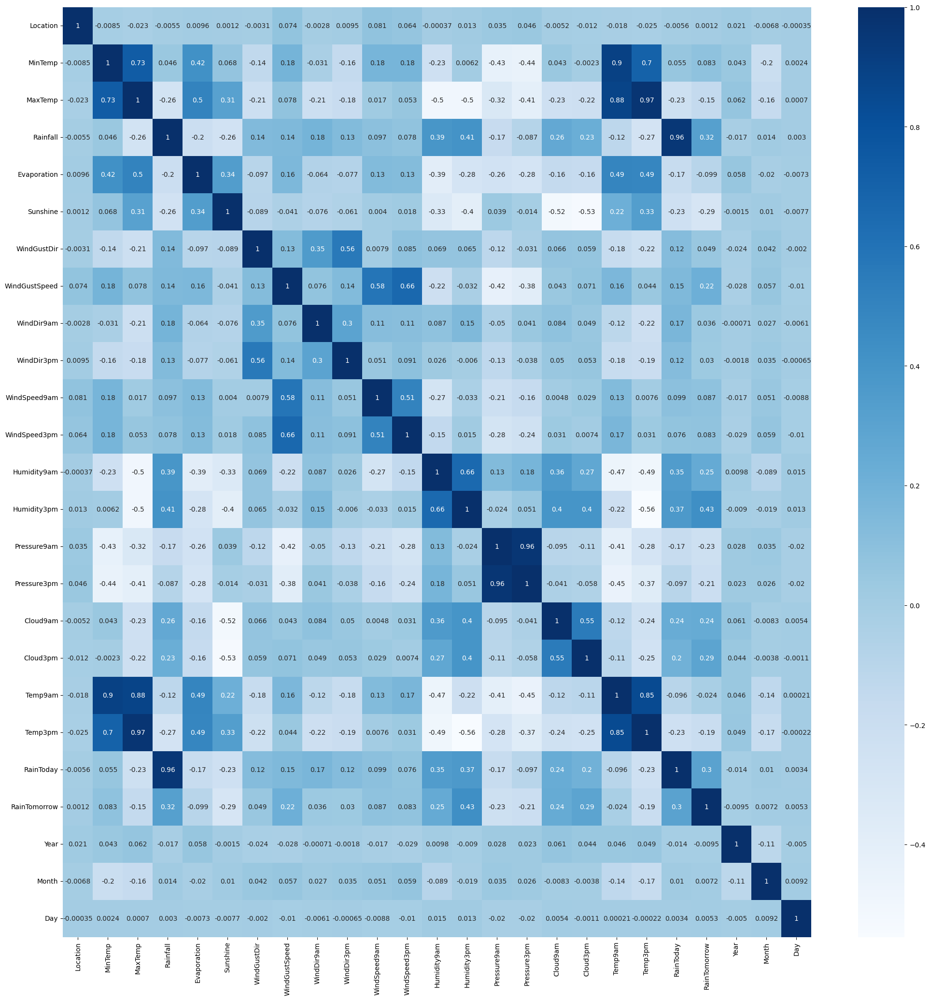

In [ ]:
plt.figure(figsize=(25,25))
sns.heatmap(df.corr(),annot=True,cmap='Blues')

#Splitting

#Checking corelation according to RainTomorrow column

In [ ]:
df.corr()['RainTomorrow'].sort_values(ascending= False)

,RainTomorrow
RainTomorrow,1.000000
Humidity3pm,0.431272
Rainfall,0.321671
RainToday,0.304062
Cloud3pm,0.290055
Humidity9am,0.250375
Cloud9am,0.241909
WindGustSpeed,0.216257
WindSpeed9am,0.086720
MinTemp,0.083237


#Splitting the Dateset into Dependent and Independent variable

In [ ]:
x = df.loc[:, ['Humidity3pm', 'Rainfall', 'Cloud3pm', 'Humidity9am', 'Cloud9am', 'WindGustSpeed', 'WindSpeed9am', 'MinTemp', 'WindSpeed3pm','WindGustDir']]

y = df['RainTomorrow']


#Feature Scaling

In [ ]:
#scaling the data
sc = StandardScaler()


In [ ]:
x_sc = sc.fit_transform(x)


In [ ]:
x = pd.DataFrame(x_sc, columns=x.columns)


In [ ]:
with open('scaler.pkl', 'wb') as f:
    pickle.dump(sc, f)

In [ ]:
x.head()

,Humidity3pm,Rainfall,Cloud3pm,Humidity9am,Cloud9am,WindGustSpeed,WindSpeed9am,MinTemp,WindSpeed3pm,WindGustDir
0,-1.443652,0.358714,0.125622,0.109440,1.464068,0.357816,0.708308,0.189751,0.641629,1.045228
1,-1.297105,-0.627098,0.125622,-1.334095,0.149133,0.357816,-1.161737,-0.752982,0.404729,1.258262
2,-1.052860,-0.627098,-1.347134,-1.654880,0.149133,0.522075,0.591430,0.111190,0.878529,1.471296
3,-1.736746,-0.627098,0.125622,-1.280631,0.149133,-1.284777,-0.343592,-0.470162,-1.135122,-0.872075
4,-0.906314,1.015921,1.598379,0.697547,1.025756,0.111427,-0.811103,0.833951,0.167829,1.045228


#Splitting the data into Train and Test

In [ ]:
x_train,x_test,y_train,y_test =train_test_split(x,y,test_size =0.2,random_state = 0)

In [ ]:
def calculate_baseline_metric(y_test):
    # Calculate the majority class
    majority_class = max(np.bincount(y_test))
    baseline_accuracy = majority_class / len(y_test)
    return baseline_accuracy

In [ ]:
baseline_accuracy = calculate_baseline_metric(y_test)
print("Baseline metric (accuracy):", baseline_accuracy)


Baseline metric (accuracy): 0.7830331362573903


#Training and Testing the Model

In [ ]:
#balancing the data
smote = SMOTE()
x_train_smote, y_train_smote = smote.fit_resample(x_train,y_train)

In [ ]:
y_train.value_counts()

,count
RainTomorrow,
0,91069
1,25299


In [ ]:
y_train_smote.value_counts()

,count
RainTomorrow,
1,91069
0,91069


In [ ]:
XGBoost = xgboost.XGBRFClassifier()
Rand_forest = RandomForestClassifier()
Dtree = DecisionTreeClassifier()
GBM = GradientBoostingClassifier()
log = LogisticRegression()
Knn = KNeighborsClassifier()

In [ ]:
XGBoost.fit(x_train_smote, y_train_smote)
Rand_forest.fit(x_train_smote, y_train_smote)
Dtree.fit(x_train_smote, y_train_smote)
GBM.fit(x_train_smote, y_train_smote)
log.fit(x_train_smote, y_train_smote)
Knn.fit(x_train_smote,y_train_smote)

KNeighborsClassifier()

In [ ]:
pred1 = XGBoost.predict(x_train_smote)
pred2 = Rand_forest.predict(x_train_smote)
pred3 = Knn.predict(x_train_smote)
pred4 = Dtree.predict(x_train_smote)
pred5 = GBM.predict(x_train_smote)
pred6 = log.predict(x_train_smote)

#Model Evaluation

In [ ]:
#Accuracy_score
print("XGBoost:", accuracy_score(y_train_smote, pred1))
print("Random Forest:", accuracy_score(y_train_smote, pred2))
print("K Nearest Neighbour", accuracy_score(y_train_smote,pred3))
print("Decision Tree:", accuracy_score(y_train_smote, pred4))
print("Gradient Boosting:", accuracy_score(y_train_smote, pred5))
print("Logistic Regression:", accuracy_score(y_train_smote, pred6))

XGBoost: 0.7837189383873766
Random Forest: 0.9993576299289549
K Nearest Neighbour 0.8995212421350843
Decision Tree: 0.9993576299289549
Gradient Boosting: 0.8467206184321778
Logistic Regression: 0.7633332967310501


In [ ]:
ypred1 = XGBoost.predict(x_test)
ypred2 = Rand_forest.predict(x_test)
ypred3 = Knn.predict(x_test)
ypred4 = Dtree.predict(x_test)
ypred5 = GBM.predict(x_test)
ypred6 = log.predict(x_test)

In [ ]:
print("XGBoost:", accuracy_score(y_test, ypred1))
print("Random Forest:", accuracy_score(y_test, ypred2))
print("K Nearest Neighbour", accuracy_score(y_test,ypred3))
print("Decision Tree:", accuracy_score(y_test, ypred4))
print("Gradient Boosting:", accuracy_score(y_test, ypred5))
print("Logistic Regression:", accuracy_score(y_test, ypred6))

XGBoost: 0.7895985150556855
Random Forest: 0.8378248315688162
K Nearest Neighbour 0.7385191805307301
Decision Tree: 0.7626151519318025
Gradient Boosting: 0.813453870479857
Logistic Regression: 0.769936752371786


In [ ]:
#  k-fold cross-validation


kf = KFold(n_splits=5, shuffle=True, random_state=42)



print("XGBoost:", cross_val_score(XGBoost, x, y, cv=kf).mean())
print("Random Forest:", cross_val_score(Rand_forest, x, y, cv=kf).mean())
print("K Nearest Neighbour", cross_val_score(Knn, x, y, cv=kf).mean())
print("Decision Tree:", cross_val_score(Dtree, x, y, cv=kf).mean())
print("Gradient Boosting:", cross_val_score(GBM, x, y, cv=kf).mean())
print("Logistic Regression:", cross_val_score(log, x, y, cv=kf).mean())


XGBoost: 0.839502268664925
Random Forest: 0.8457651588065447
K Nearest Neighbour 0.8285301801182456
Decision Tree: 0.7694761446445758
Gradient Boosting: 0.8438814794445207
Logistic Regression: 0.8392066547504469


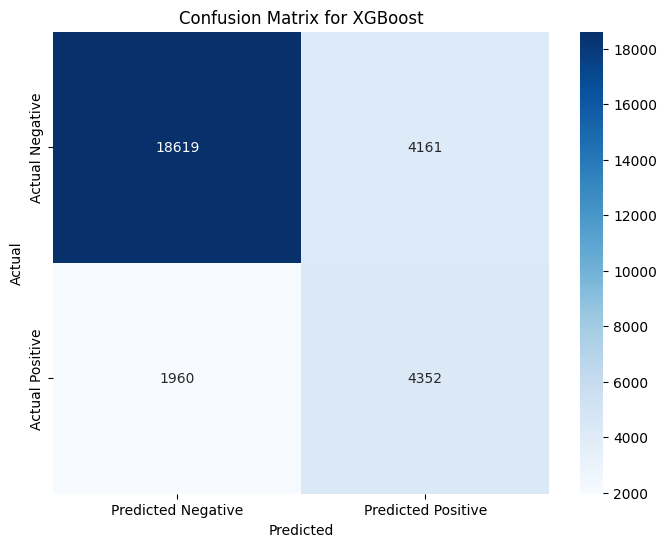

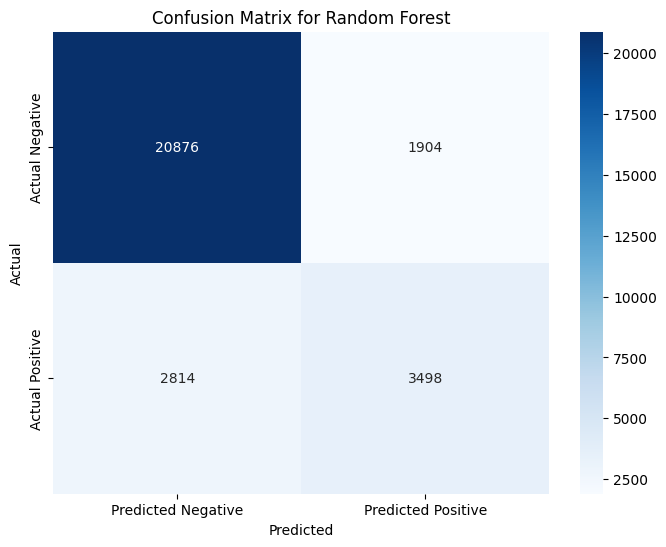

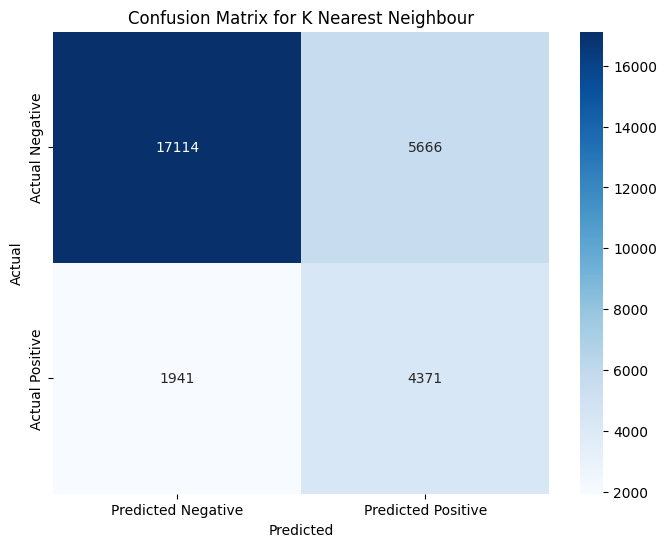

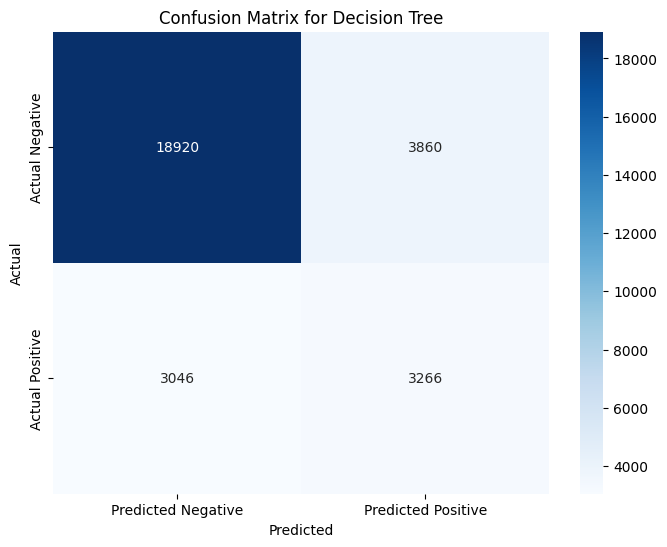

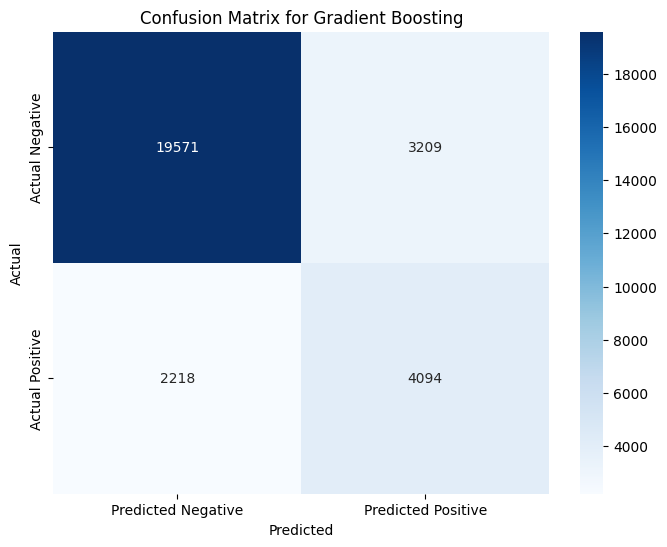

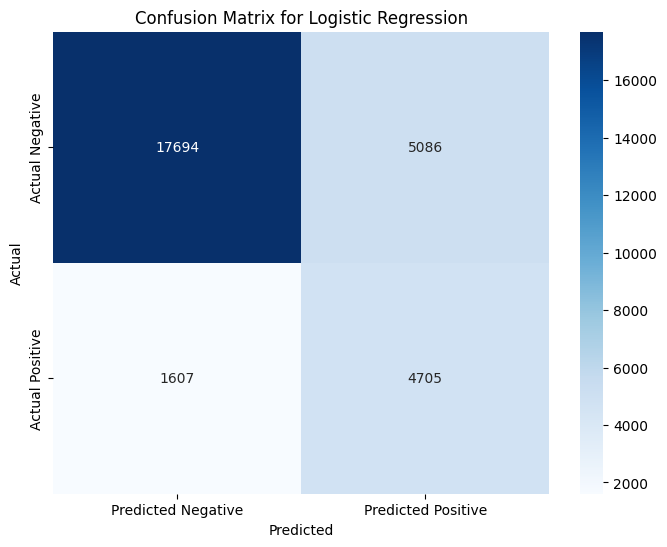

In [ ]:
models = ["XGBoost", "Random Forest", "K Nearest Neighbour", "Decision Tree", "Gradient Boosting", "Logistic Regression"]
predictions = [ypred1, ypred2, ypred3, ypred4, ypred5, ypred6]

# Function to plot confusion matrix
def plot_confusion_matrix(y_test, y_pred, model_name):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted Negative', 'Predicted Positive'], yticklabels=['Actual Negative', 'Actual Positive'])
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Loop through each model and its predictions
for model, y_pred in zip(models, predictions):
    plot_confusion_matrix(y_test, y_pred, model)

In [ ]:
#crosstable
def create_crosstab(y_test, y_pred, model_name):
    ct = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])
    print(f'Crosstab for {model_name}:\n{ct}\n')

# Function to print classification report
def print_classification_report(y_test, y_pred, model_name):
    report = classification_report(y_test, y_pred)
    print(f'Classification Report for {model_name}:\n{report}\n')

# Loop through each model and its predictions
for model, y_pred in zip(models, predictions):
    create_crosstab(y_test, y_pred, model)
    print_classification_report(y_test, y_pred, model)

Crosstab for XGBoost:
Predicted      0     1
Actual                
0          18619  4161
1           1960  4352

Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.90      0.82      0.86     22780
           1       0.51      0.69      0.59      6312

    accuracy                           0.79     29092
   macro avg       0.71      0.75      0.72     29092
weighted avg       0.82      0.79      0.80     29092


Crosstab for Random Forest:
Predicted      0     1
Actual                
0          20876  1904
1           2814  3498

Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90     22780
           1       0.65      0.55      0.60      6312

    accuracy                           0.84     29092
   macro avg       0.76      0.74      0.75     29092
weighted avg       0.83      0.84      0.83     29092


Crosstab for K Nearest Neighbour

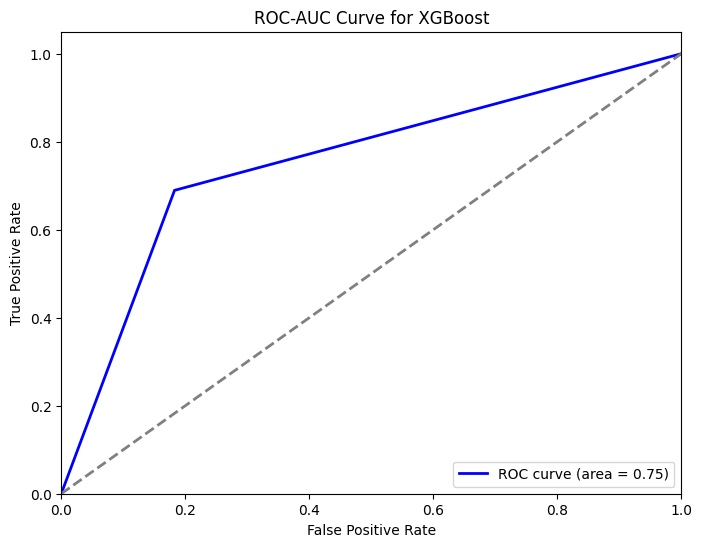

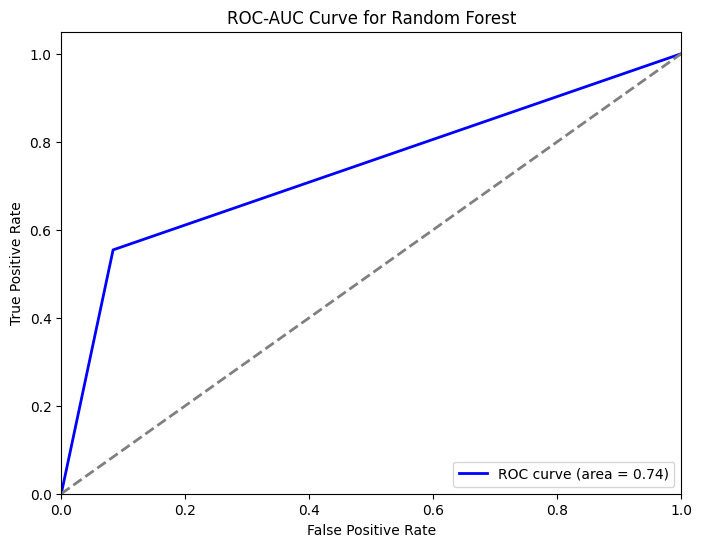

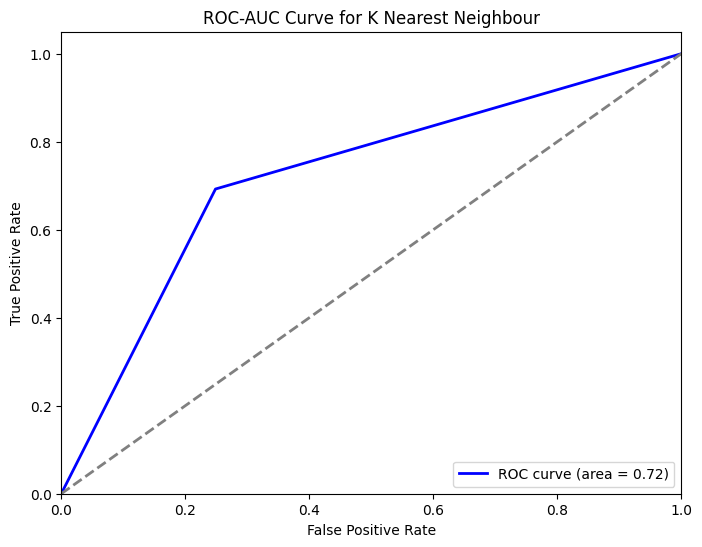

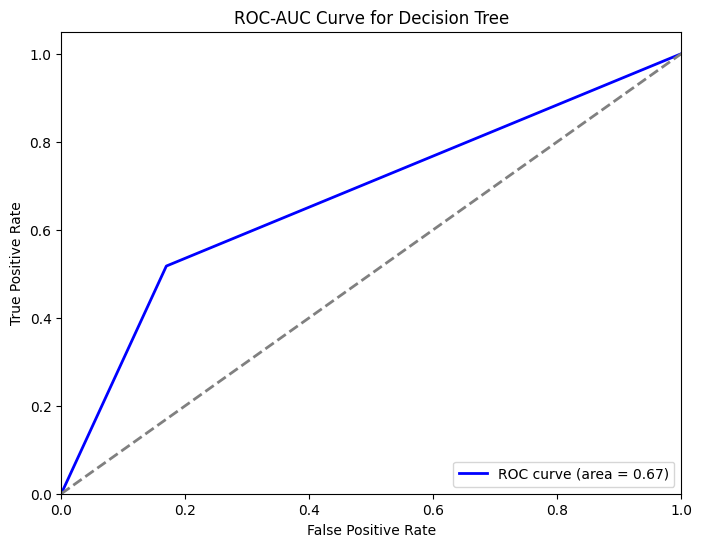

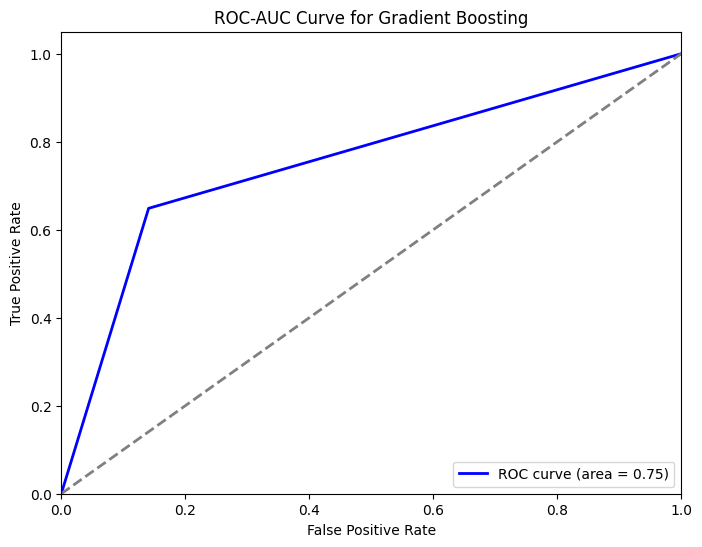

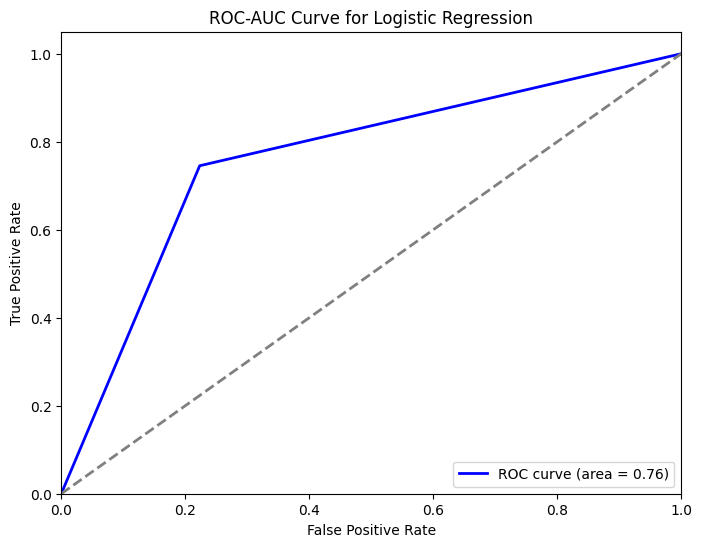

In [ ]:
# Roc-Auc Curve
def plot_roc_auc(y_test, y_pred, model_name):
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC-AUC Curve for {model_name}')
    plt.legend(loc="lower right")
    plt.show()

# Loop through each model and its predictions
for model, y_pred in zip(models, predictions):
    plot_roc_auc(y_test, y_pred, model)

In [ ]:
XGBoost = xgboost.XGBRFClassifier()
Rand_forest = RandomForestClassifier()
svm = SVC()
Dtree = DecisionTreeClassifier()
GBM = GradientBoostingClassifier()
log = LogisticRegression()
Knn = KNeighborsClassifier()

#Checking Hyper parameters

In [ ]:
def hyperparameter_tuning(models, param_grids, x_train_smote, y_train_smote):
    best_models = {}

    for model_name, model in models.items():
        print(f"Tuning hyperparameters for {model_name}...")
        grid_search = GridSearchCV(estimator=model, param_grid=param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1)
        grid_search.fit(x_train_smote, y_train_smote)
        best_models[model_name] = grid_search.best_estimator_
        print(f"Best parameters for {model_name}: {grid_search.best_params_}")

    return best_models

# Example usage:
modelH = {
    "XGBoost": xgboost.XGBClassifier(),
    "Random Forest": RandomForestClassifier(),
    "K Nearest Neighbour": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "Logistic Regression": LogisticRegression()
}

param_grids = {
    "XGBoost": {
        'n_estimators': [100, 200],
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5, 7]
    },
    "Random Forest": {
        'n_estimators': [100, 200],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5]
    },
    "K Nearest Neighbour": {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance']
    },
    "Decision Tree": {
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5]
    },
    "Gradient Boosting": {
        'n_estimators': [100, 200],
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5, 7]
    },
    "Logistic Regression": {
        'C': [0.1, 1, 10],
        'penalty': ['l2'],
        'solver': ['lbfgs']
    }
}

# Assuming X_train and y_train are your training data
best_models = hyperparameter_tuning(modelH, param_grids, x_train_smote, y_train_smote)

Tuning hyperparameters for XGBoost...
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}
Tuning hyperparameters for Random Forest...
Best parameters for Random Forest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Tuning hyperparameters for K Nearest Neighbour...
Best parameters for K Nearest Neighbour: {'n_neighbors': 3, 'weights': 'distance'}
Tuning hyperparameters for Decision Tree...
Best parameters for Decision Tree: {'max_depth': None, 'min_samples_split': 2}
Tuning hyperparameters for Gradient Boosting...
Best parameters for Gradient Boosting: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}
Tuning hyperparameters for Logistic Regression...
Best parameters for Logistic Regression: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
best_models = {
    'XGBoost': xgboost.XGBRFClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=0.1, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=7, max_leaves=None,
               min_child_weight=None, monotone_constraints=None,
               multi_strategy=None, n_estimators=200, n_jobs=None,
               num_parallel_tree=None, random_state=None),
 'Random Forest': RandomForestClassifier(n_estimators=200),
 'K Nearest Neighbour': KNeighborsClassifier(n_neighbors=3, weights='distance'),
 'Decision Tree': DecisionTreeClassifier(),
 'Gradient Boosting': GradientBoostingClassifier(max_depth=7, n_estimators=200),
 'Logistic Regression': LogisticRegression(C=10)
}

In [ ]:
best_scores = {}
for model_name, model in best_models.items():
    y_pred = model.predict(x_train_smote)
    score = accuracy_score(y_train_smote, y_pred)
    best_scores[model_name] = score
    print(f"Best score for {model_name}: {score}")

Best score for XGBoost: 0.9060602400377735
Best score for Random Forest: 0.9993576299289549
Best score for K Nearest Neighbour: 0.9993576299289549
Best score for Decision Tree: 0.9993576299289549
Best score for Gradient Boosting: 0.9127749289000648
Best score for Logistic Regression: 0.7633278063885626


In [ ]:
best_scores = {}
for model_name, model in best_models.items():
    y_pred = model.predict(x_test)
    score = accuracy_score(y_test, y_pred)
    best_scores[model_name] = score
    print(f"Best score for {model_name}: {score}")

Best score for XGBoost: 0.845490169118658
Best score for Random Forest: 0.8379623264127595
Best score for K Nearest Neighbour: 0.745531417571841
Best score for Decision Tree: 0.7630620101746185
Best score for Gradient Boosting: 0.8458682799395023
Best score for Logistic Regression: 0.769936752371786


In [ ]:
def fit_and_evaluate_models(models, X_train, y_train, X_test, y_test):
    for name, model in models.items():
        print(f"Fitting {name}...")
        model.fit(X_train, y_train)
        print(f"Evaluating {name}...")
        y_pred = model.predict(X_test)
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print("Confusion Matrix:")
        print(confusion_matrix(y_test, y_pred))
        print("\n")

In [ ]:
fit_and_evaluate_models(best_models, x_train_smote, y_train_smote, x_test, y_test)


Fitting XGBoost...
Evaluating XGBoost...
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.81      0.86     22780
           1       0.51      0.69      0.59      6312

    accuracy                           0.79     29092
   macro avg       0.71      0.75      0.72     29092
weighted avg       0.82      0.79      0.80     29092

Confusion Matrix:
[[18518  4262]
 [ 1926  4386]]


Fitting Random Forest...
Evaluating Random Forest...
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90     22780
           1       0.65      0.56      0.60      6312

    accuracy                           0.84     29092
   macro avg       0.77      0.74      0.75     29092
weighted avg       0.83      0.84      0.83     29092

Confusion Matrix:
[[20881  1899]
 [ 2795  3517]]


Fitting K Nearest Neighbour...
Evaluating K Nearest Neighbour...
Classification Report:
              pr

Ater checking the performaces of all models after Evaluation GradientBoostingClassifier is giving good results so choosing GradientBoostingClassifier as our final models

In [ ]:
x_train_smote.head()

,Humidity3pm,Rainfall,Cloud3pm,Humidity9am,Cloud9am,WindGustSpeed,WindSpeed9am,MinTemp,WindSpeed3pm,WindGustDir
0,1.047644,-0.298494,1.107460,0.269833,0.149133,1.014853,1.993963,1.038210,1.115430,-1.298142
1,0.168363,-0.298494,0.125622,0.269833,-0.727490,0.686335,-0.109837,-0.454450,0.641629,-0.872075
2,-0.222429,1.673129,-1.347134,0.857940,-1.604113,-1.120518,-1.629248,-0.203055,-0.898222,0.832195
3,-0.710918,-0.627098,-1.838053,-1.334095,-1.604113,0.275686,1.409574,1.116771,-0.187521,-1.298142
4,2.366565,1.837431,1.598379,1.659903,1.464068,-1.613296,-0.343592,0.551132,-0.661322,-1.724209


In [ ]:
y_train_smote.head()

,RainTomorrow
0,1
1,0
2,0
3,0
4,1


In [ ]:
y_test.head()

,RainTomorrow
138175,1
38638,1
124058,0
99214,0
25097,0


In [ ]:
x_test.head()

,Humidity3pm,Rainfall,Cloud3pm,Humidity9am,Cloud9am,WindGustSpeed,WindSpeed9am,MinTemp,WindSpeed3pm,WindGustDir
138175,-1.248256,1.837431,0.616541,-1.013309,-1.165802,1.425502,0.708308,1.525289,1.707680,-0.446007
38638,-1.443652,-0.627098,1.107460,-1.173702,-0.289178,1.589761,0.357674,1.305318,0.167829,1.258262
124058,-0.027033,-0.298494,0.125622,-0.050953,0.149133,0.850594,1.643330,-1.114363,0.404729,1.045228
99214,1.340737,1.015921,0.125622,0.590618,0.149133,-0.956259,-0.343592,-0.045932,-0.661322,0.832195
25097,0.021816,-0.627098,0.125622,1.018332,0.149133,-2.023944,-1.395492,-0.737270,-1.372022,-0.872075


In [ ]:
pres_model = GradientBoostingClassifier(max_depth=5, n_estimators=200)

In [ ]:
pres_model.fit(x_train_smote, y_train_smote)

GradientBoostingClassifier(max_depth=5, n_estimators=200)

In [ ]:
y_predict = pres_model.predict(x_test)

In [ ]:
accuracy_score(y_test,y_predict)

0.8438402309913379

In [ ]:
pres_model.predict([[65, 5.2, 6, 80, 5, 45, 20, 15, 25, 7]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


array([1])

In [ ]:
with open('RFmodel.pkl', 'wb') as file:
    pickle.dump(pres_model, file)

In [ ]:
with open('RFmodel.pkl', 'rb') as file:
    loaded_model = pickle.load(file)

In [ ]:
loaded_model.predict([[65, 5.2, 6, 80, 5, 45, 20, 15, 25, 7]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


array([1])

In [ ]:
loaded_model.predict([[-0.027033, -0.298494, 0.125622, -0.050953, 0.149133, 0.850594, 1.643330, -1.114363, 0.404729, 1]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


array([0])

In [ ]:
loaded_model.predict([[65, 5.2, 6, 80, 5, 45, 20, 15, 25, 7]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


array([1])

In [ ]:
loaded_model.predict([[0.021816, -0.627098, 0.125622, 1.018332, 0.149133, -2.023944, -1.395492, -0.737270, -1.372022, 0]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


array([0])